In [1]:
import os 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import time 
import pickle
import warnings


from utils import *

from sensor_params import *
from models.unet1D_regressor import *
from models.training import *

# Dataset path 
DATABASE_PATH = r"C:\Users\aralmeida\OneDrive - Universidad de Las Palmas de Gran Canaria\Doctorado\Bases de datos\WARIFA\Mikael T1DM"

filename = "MIKAEL_data.json"

In [2]:
with open(DATABASE_PATH+'\CGM.pk1', 'rb') as f:
    sgv_data_dict = pickle.load(f)

In [3]:
CGM_data_dict = sgv_data_dict
prediction_time = 30
verbose = 0
N = 96
glucose_sensor = sensor_Mikael

In [4]:
# Variable to store CGM and times as a single continue value to further split them as desired
time_concat = np.array(0)
glucose_concat = np.array(0)

# Declare X an Y vector with all time and glucose concatenated data to further processing 
for key in CGM_data_dict.keys():

    # Concatenate CGN and time with current key data
    time_concat = np.hstack((time_concat, CGM_data_dict[key]['time']))
    glucose_concat = np.hstack((glucose_concat, CGM_data_dict[key]['glucose']))

# Remove first element arrays
glucose_concat = np.delete(glucose_concat, 0)
time_concat = np.delete(time_concat, 0)

In [5]:
time_concat[0]

'2019-12-25T12:16:34.594Z'

In [6]:
time_concat = time_concat.astype('datetime64[s]')
time_concat[0]

C:\Users\aralmeida\AppData\Local\Temp\ipykernel_11452\3522604657.py:1: DeprecationWarning: parsing timezone aware datetimes is deprecated; this will raise an error in the future
  time_concat = time_concat.astype('datetime64[s]')


numpy.datetime64('2019-12-25T12:16:34')

In [7]:
print(time_concat[0])
print(time_concat[1])
print(time_concat[2])
print(time_concat[3])
print("#############")
print(time_concat[1] - time_concat[0])
print(time_concat[2] - time_concat[1])
print(time_concat[3] - time_concat[2])

2019-12-25T12:16:34
2019-12-25T12:23:47
2019-12-25T12:28:47
2019-12-25T12:33:47
#############
433 seconds
300 seconds
300 seconds


In [8]:
# Express time_concat in seconds for more efficient processing and accurate calculation
time_concat = time_concat.astype('int64')

In [9]:
print(time_concat[0])
print(time_concat[1])
print(time_concat[2])
print(time_concat[3])
print("#############")
print(time_concat[1] - time_concat[0])
print(time_concat[2] - time_concat[1])
print(time_concat[3] - time_concat[2])

1577276194
1577276627
1577276927
1577277227
#############
433
300
300


In [10]:
time_diff = np.diff(time_concat)

In [11]:
# Compute the differentce between two consecutive samples (in minutes)
#time_diff = np.diff(time_concat.astype('datetime64[s]'))

# Find indexes where the difference between two consecutive samples is greater than 10 minutes
#time_diff_10_idx = np.where(time_diff > np.timedelta64(600, 's'))
time_diff_10_idx = np.where(time_diff >= 600)

# Number of blocks without time intervals of more than 10 minutes
n_blocks = len(time_diff_10_idx[0])
print("Number of blocks is %i\n" % n_blocks)


Number of blocks is 335



In [12]:
# Step for the output  value identification - 1: the output is 5 min (value 50) / 2: 10 min (value 51) / etc. 
step = prediction_time/5

# Numpy array to count samples in each block
num_samples = np.zeros((n_blocks, 1))

# Global index useful to extract the blocks for the original array
global_idx = 0 # 1 in matlab

# List to store the indexes X and Y (faster computation than concatenate arrays)
X_init_list = []
X_end_list = []
Y_idxs_list = []

for i in range(0, n_blocks):

    # Compute size of the current block
    block_size = time_diff_10_idx[0][i]-global_idx
    
    if verbose == 1:
        print("Block size is %i" % (block_size))
    
    # Loop until the last value possible value of the block considering N
    for j in range(0, round(block_size - N - step )):

        # Reference value for the initial data point to be collected 
        X_init_list.append(global_idx+j)

        # Reference value for the last data point to be collected 
        X_end_list.append(global_idx+j+N)

        # Extract glucose output (Y) indexes (Ground Truth) and the time associated 
        Y_idxs_list.append(round(global_idx+j+N+step-1)) # For slicing N samples, index N. For indexing sample in the Nth, index N

        # Count the samples of the current block
        num_samples[i] = j+1

        # Print number of samples 
        if verbose == 1:
            print("Number of samples in block %i is %i\n" % ((i+1), num_samples[i]))

    # Update the global index
    global_idx = time_diff_10_idx[0][i] 

# Declare X an Y vector with all time and glucose concatenated data to further processing
X = np.zeros((len(X_init_list), N), dtype=np.float32)
Y = np.zeros((len(Y_idxs_list), round(glucose_sensor['PREDICTED_POINTS'])), dtype=np.float32) # Check values on sensor_params.py and arch_params.py
X_times = np.empty((len(X_init_list), N), dtype='datetime64[s]')
Y_times = np.empty((len(Y_idxs_list), round(glucose_sensor['PREDICTED_POINTS'])), dtype='datetime64[s]')

for i in range(0, X.shape[0]):
    X[i,:] = glucose_concat[X_init_list[i] : X_end_list[i]]
    Y[i] = glucose_concat[Y_idxs_list[i]]
    X_times[i,:] = time_concat[X_init_list[i] : X_end_list[i]]
    Y_times[i] = time_concat[Y_idxs_list[i]] 

In [13]:
print("X_times shape: ",str(X_times.shape))
print("Y_times shape: ",str(Y_times.shape))
print("X_train: ")
print(X[1,47])
print(X[2,47])
print(X[3,47])
print(X[4,47])
print(X[5,47])
print("Y_train:")
print(Y[0,0])
print(Y[1,0])
print(Y[2,0])
print(Y[3,0])
print(Y[4,0])

X_times shape:  (166984, 96)
Y_times shape:  (166984, 1)
X_train: 
86.0
89.0
85.0
85.0
88.0
Y_train:
175.0
176.0
172.0
176.0
179.0


In [14]:
print("Last sample of second instance of X: ",str(X[1,47]),"must be the same as the first sample of Y: ",str(Y[0,0]))
print("Last sample of third instance of X: ",str(X[2,47]),"must be the same as the first sample of Y: ",str(Y[1,0]))
print("Last sample of fourth instance of X: ",str(X[3,47]),"must be the same as the first sample of Y: ",str(Y[2,0]))
print("Last sample of fifth instance of X: ",str(X[4,47]),"must be the same as the first sample of Y: ",str(Y[3,0]))
print("Last sample of sixth instance of X: ",str(X[5,47]),"must be the same as the first sample of Y: ",str(Y[4,0]))

Last sample of second instance of X:  86.0 must be the same as the first sample of Y:  175.0
Last sample of third instance of X:  89.0 must be the same as the first sample of Y:  176.0
Last sample of fourth instance of X:  85.0 must be the same as the first sample of Y:  172.0
Last sample of fifth instance of X:  85.0 must be the same as the first sample of Y:  176.0
Last sample of sixth instance of X:  88.0 must be the same as the first sample of Y:  179.0


In [15]:
print("Last sample of second instance of X: ",str(X_times[1,47]),"must be the same as the first sample of Y: ",str(Y_times[0,0]))
print("Last sample of third instance of X: ",str(X_times[2,47]),"must be the same as the first sample of Y: ",str(Y_times[1,0]))
print("Last sample of fourth instance of X: ",str(X_times[3,47]),"must be the same as the first sample of Y: ",str(Y_times[2,0]))
print("Last sample of fifth instance of X: ",str(X_times[4,47]),"must be the same as the first sample of Y: ",str(Y_times[3,0]))
print("Last sample of sixth instance of X: ",str(X_times[5,47]),"must be the same as the first sample of Y: ",str(Y_times[4,0]))

Last sample of second instance of X:  2019-12-25T16:22:49 must be the same as the first sample of Y:  2019-12-25T20:52:06
Last sample of third instance of X:  2019-12-25T16:27:49 must be the same as the first sample of Y:  2019-12-25T20:57:05
Last sample of fourth instance of X:  2019-12-25T16:32:49 must be the same as the first sample of Y:  2019-12-25T21:02:05
Last sample of fifth instance of X:  2019-12-25T16:37:49 must be the same as the first sample of Y:  2019-12-25T21:07:05
Last sample of sixth instance of X:  2019-12-25T16:42:51 must be the same as the first sample of Y:  2019-12-25T21:12:06


Position 0: 
X ini: 0 - X end: 96 - Y - 101

Position 1: 
X ini: 1 - X end: 97 - Y - 102

Position 2: 
X ini: 2 - X end: 98 - Y - 103

Position 3: 
X ini: 3 - X end: 99 - Y - 104

Position 4: 
X ini: 4 - X end: 100 - Y - 105

Position 5: 
X ini: 5 - X end: 101 - Y - 106

Position 6: 
X ini: 6 - X end: 102 - Y - 107

Position 7: 
X ini: 7 - X end: 103 - Y - 108

Position 8: 
X ini: 8 - X end: 104 - Y - 109

Position 9: 
X ini: 9 - X end: 105 - Y - 110

Position 10: 
X ini: 10 - X end: 106 - Y - 111

Position 11: 
X ini: 11 - X end: 107 - Y - 112

Position 12: 
X ini: 12 - X end: 108 - Y - 113

Position 13: 
X ini: 13 - X end: 109 - Y - 114

Position 14: 
X ini: 14 - X end: 110 - Y - 115

Position 15: 
X ini: 15 - X end: 111 - Y - 116

Position 16: 
X ini: 16 - X end: 112 - Y - 117

Position 17: 
X ini: 17 - X end: 113 - Y - 118

Position 18: 
X ini: 18 - X end: 114 - Y - 119

Position 19: 
X ini: 19 - X end: 115 - Y - 120

Position 20: 
X ini: 20 - X end: 116 - Y - 121

Position 21: 
X 

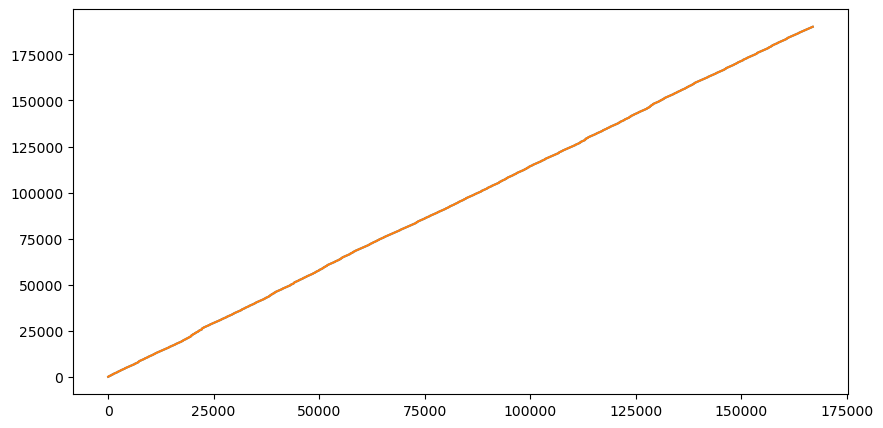

In [16]:
# Check indexes

# Plot X_end list and Y_end_list
plt.figure(figsize=(10,5))
plt.plot(X_end_list,label='X_end_list')
plt.plot(Y_idxs_list,label='Y_idxs_list')

for i in range(0, len(X_end_list)):
    print("Position %i: " % (i))
    print("X ini: %i - X end: %i - Y - %i\n" % (X_init_list[i], X_end_list[i], Y_idxs_list[i]))

In [17]:
print(X[0,0])
print(glucose_concat[0])
print(X[0,47])

print(glucose_concat[47])
print(Y[0,0])
print(glucose_concat[48])

print("#########")
print(X[0,47])
print(X[1,47])
print(glucose_concat[48])
print(Y[0])

311.0
311
87.0
87
175.0
86
#########
87.0
86.0
86
[175.]


In [18]:
len(X)

166984

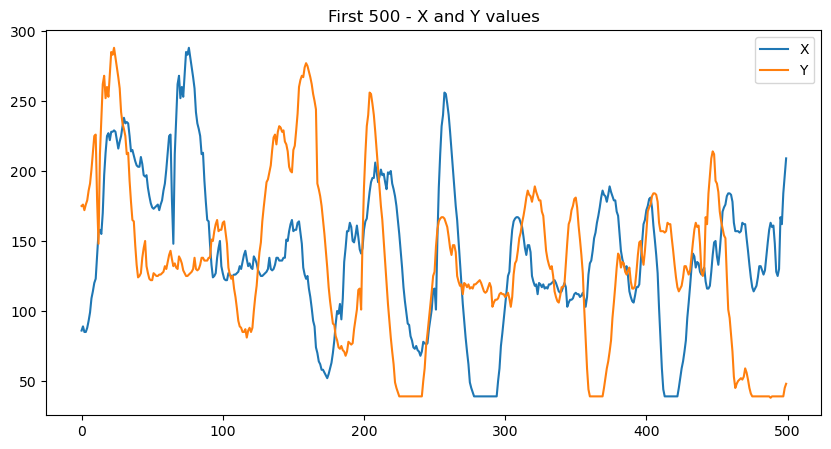

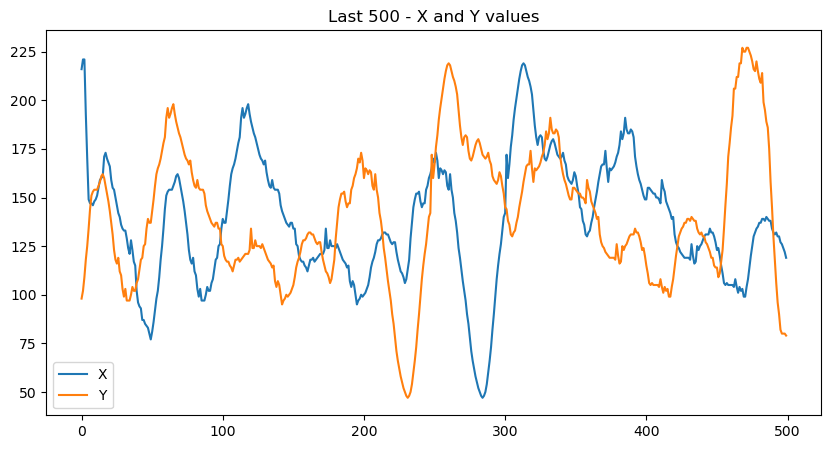

In [19]:
# Plot index 47 of first 500 samples of X and Y
plt.figure(figsize=(10,5))
plt.plot(X[1:501,47],label='X')
plt.plot(Y[0:500],label='Y')
plt.title("First 500 - X and Y values")
plt.legend()

# Plot last 500 samples
plt.figure(figsize=(10,5))
plt.plot(X[len(X)-1-500:len(X)-1,47],label='X')
plt.plot(Y[len(X)-1-500-1:len(X)-1-1],label='Y')
plt.title("Last 500 - X and Y values")
plt.legend()

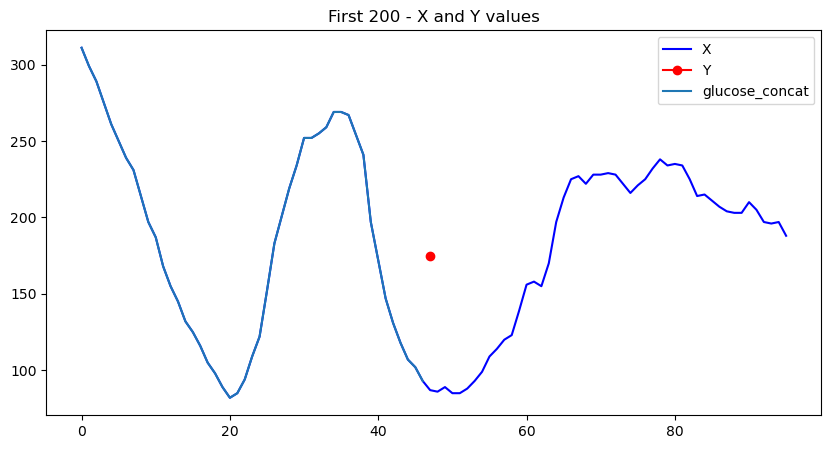

In [20]:
dummy_np = np.zeros((1, 48), dtype=np.float32)
dummy_np[0,47] = Y[0,]

# Plot index 47 of first 500 samples of X and Y
plt.figure(figsize=(10,5))
plt.plot(X[0,:],label='X', color='blue')
plt.plot(47, Y[0,],label='Y', color='red', marker='o')
plt.plot(glucose_concat[0:47],label='glucose_concat')
plt.title("First 200 - X and Y values")
plt.legend()

